<a href="https://colab.research.google.com/github/arudhatt/flight-data-visualization/blob/main/flight_travel_visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
from google.colab import drive
MOUNTPOINT = '/content/gdrive'
DATADIR = os.path.join(MOUNTPOINT, 'My Drive', 'Colab Notebooks')
drive.mount(MOUNTPOINT)

Mounted at /content/gdrive


In [ ]:
### Let us visualize the flight travels using a flight dataset

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [2]:
!pip install gcmap

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 6.3 MB/s eta 0:00:00
  Created wheel for gcmap: filename=gcmap-0.0.6-py3-none-any.whl size=4702 sha256=d6ea402ef563d041e61af63cd0d0a6e65a04c9d2c5843a136cda26f2922aab5d
  Stored in directory: /root/.cache/pip/wheels/c4/e2/3b/ff4d957a8a5565eced3cf70d50e558728620940772283de9bb
Successfully built gcmap


In [3]:
import pandas as pd
from gcmap import GCMapper, Gradient
from IPython.display import Image

In [5]:
filecols = ('lon_departure', 'lat_departure', 'lon_arrival', 'lat_arrival')
flights = pd.read_csv(f'{DATADIR}/data/flights.csv', names=filecols, na_values=['\\N'], skiprows=1)
flights.head()

flights = flights.sort_values(['lon_departure',  'lat_departure', 'lon_arrival', 'lat_arrival'],
                              ascending=[False, False, False, False])

print(flights.loc[10000])
print(flights.loc[9000])

lon_departure    23.676
lat_departure    43.158
lon_arrival      12.417
lat_arrival      42.340
Name: 10000, dtype: float64
lon_departure    -5.862
lat_departure    36.211
lon_arrival       4.807
lat_arrival      51.502
Name: 9000, dtype: float64


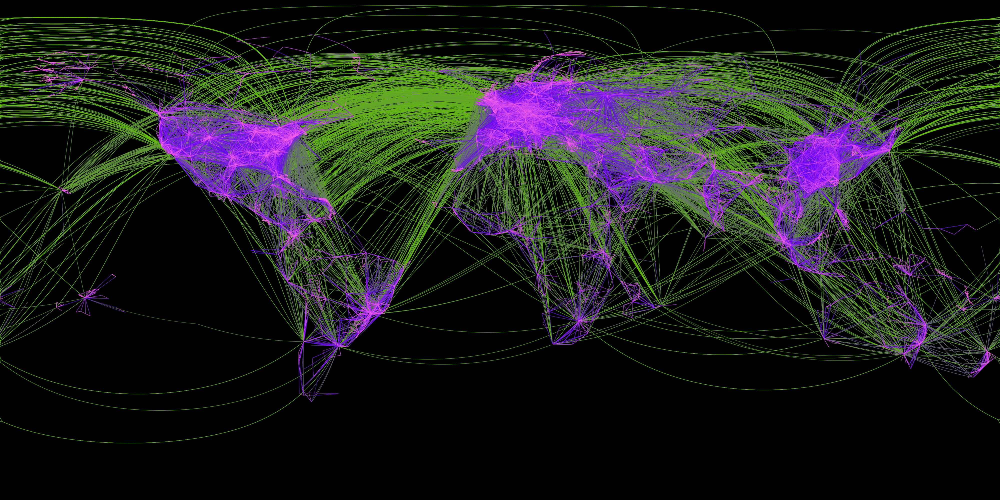

In [ ]:
grad = Gradient(((0, 100, 200, 0), (0.5, 104, 0, 253), (1, 255, 104, 230)))
gcm = GCMapper(cols=grad, height=2000, width=4000)
fli1000 = flights[9000:10000]
gcm.set_data(flights['lon_departure'],
             flights['lat_departure'],
             flights['lon_arrival'],
             flights['lat_arrival'])
# run & save
img = gcm.draw()
img.save('flights_routes_gcmap.png')
Image("flights_routes_gcmap.png")


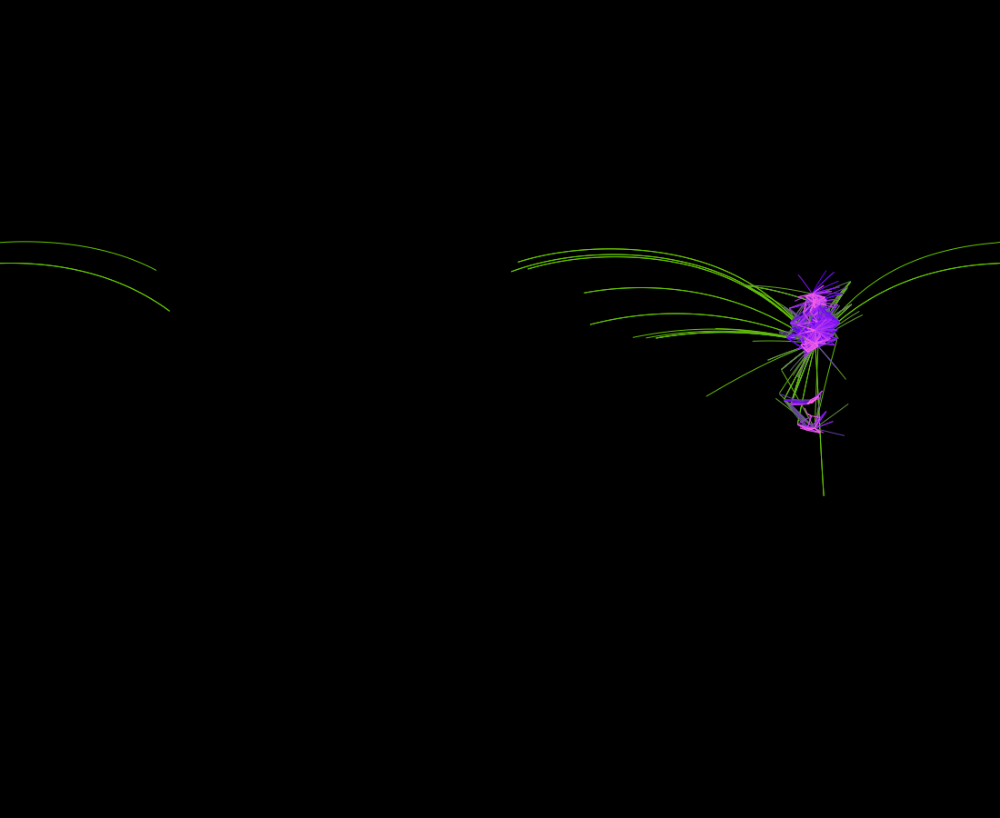

In [ ]:
grad = Gradient(((0, 100, 200, 0), (0.5, 104, 0, 253), (1, 255, 104, 230)))
gcm = GCMapper(cols=grad, height=900, width=1100)
gcm.set_data(fli1000['lon_departure'],
             fli1000['lat_departure'],
             fli1000['lon_arrival'],
             fli1000['lat_arrival'])
# run & save
img = gcm.draw()
img.save('flights_routes_top1000_gcmap.png')
Image("flights_routes_top1000_gcmap.png")

In [ ]:
!pip install Basemap

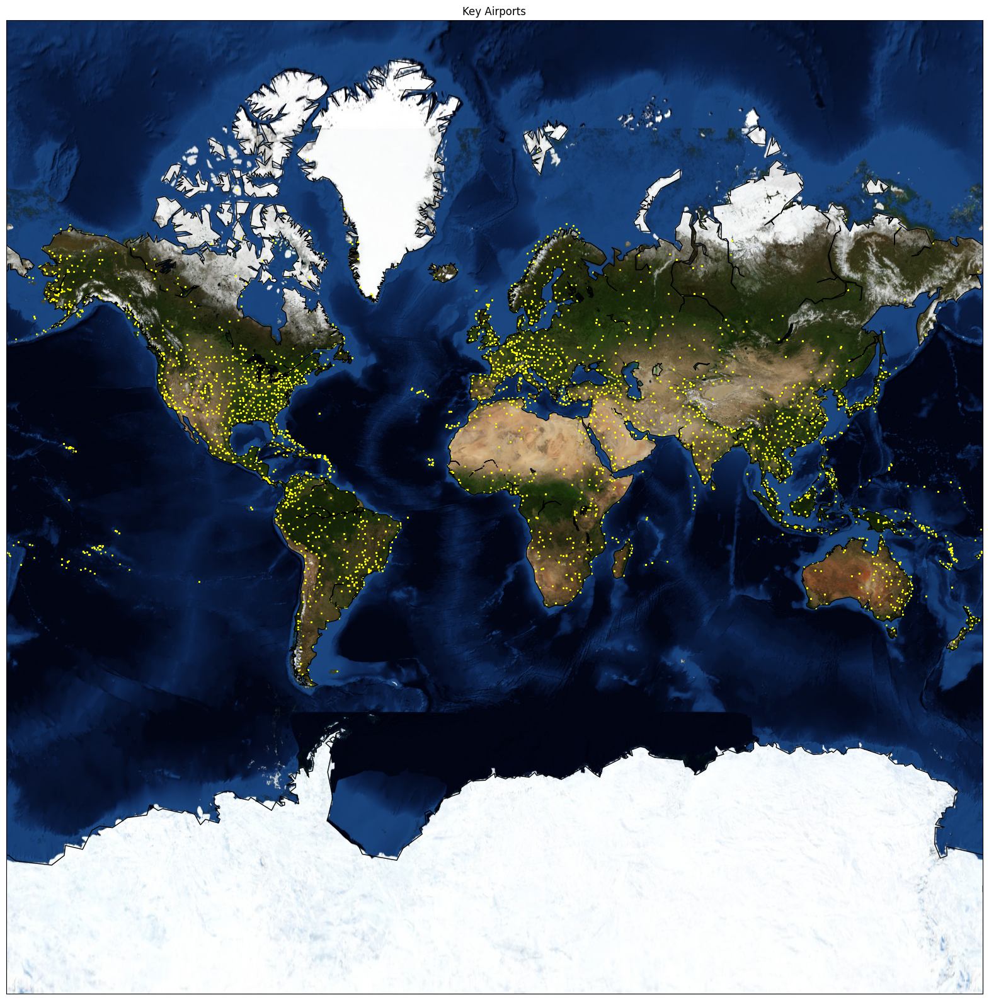

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

longitudes = flights["lon_departure"].tolist()
latitudes = flights["lat_departure"].tolist()
fig, ax = plt.subplots(figsize=(20,30))
plt.title("Key Airports")
m = Basemap(projection='merc',
            llcrnrlat=-85,
            urcrnrlat=85,
            llcrnrlon=-180,
            urcrnrlon=180)
x, y = m(longitudes, latitudes)
m.scatter(x,y,s=1, marker='o', color='yellow')
m.bluemarble()
m.drawcoastlines()
plt.show()

In [ ]:
import plotly.express as px
fig = px.scatter(flights, x='lon_departure', y='lat_departure', color='lon_arrival')
fig

In [ ]:
import plotly.express as px
fig = px.scatter_3d(flights, x='lon_departure', y='lat_departure', z='lon_arrival', color='lat_arrival', title='3D-Scatter Plot of Arrival & Departure')
fig

In [ ]:
fig = px.strip(flights, x='lon_departure', y='lon_arrival',title='Strip Plot')
fig

# Let us try AutoViz for the data

In [ ]:
%%capture
!pip install xlrd
!pip install autoviz
import pandas as pd
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df = AV.AutoViz(flights)